# 3. Fitting diads once you have groups
- Once you have divided your diads into groups based on strengths, you need to tweak the fit parameters for each group
- Then you can loop through all files in a given group and automatically fit the spectra

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
import DiadFit as pf
pf.__version__

'0.0.88'

## Specifying filetype, and folder as before

In [2]:
# This specifies what file type your Raman exported in. 
meta_path, spectra_path, spectra_filetype, prefix, str_prefix, spectra_file_ext, meta_file_ext, TruPower=pf.get_settings()

## Load in data and fit parameters
- This loads in the dataframes of the fit parameters you saved in the other file, by group
- At this point you select what group you want to fit (batch = 'Weak', 'Medium' or 'Strong'). After running through the entire notebook for one group, come back up here to fit a second group.

In [3]:
## load dataframes and numpy arrays 
np_x = joblib.load('np_x.sav')

# Select the group you want to fit ('Weak', 'Medium', 'Strong'). After selecting one, go through and select another one and run again from here. 
batch='Weak' # Options are Weak, Medium, Strong

if batch=='Weak':
    GroupN_df=joblib.load('Weak_df.sav')
if batch=='Medium':
    GroupN_df=joblib.load('Medium_df.sav')
if batch=='Strong':
    GroupN_df=joblib.load('Strong_df.sav')

### Now load one file from this group to tweak parameters for

In [4]:
Diad_Files =GroupN_df['filename']
i=0


### Lets plot the diad to have a look at it

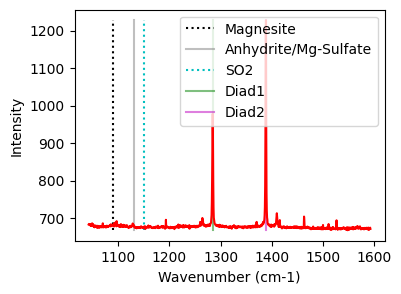

In [5]:
plot1=pf.plot_diad(path=spectra_path, filename=Diad_Files[i], filetype=spectra_filetype)

## Now lets inspect the diads and get their approximate positions
- As with generic peak, you can exclude 2 segments (e.g. around cosmic rays)
- You then specify how many peaks you want to fit on each diad. 1 means just the strong peak, 2 hotbands, and 3 for Diad2 would also fit the C13 peak if present. 
- The identify_diad_peaks then uses scipy findpeaks to identify the positions of the 2 diads, and any other peaks the user asks for. These are saved, and fed into the later functions for peak fitting. 

## Choose a model for fitting all peaks
- Option of Voigt or PseudoVoigt. We recomend PsuedoVoigt

In [6]:
model_name='PseudoVoigtModel'

## Fit Diad 1
- Tweak the parameters in the config files for each group. E.g. how many peaks (fit_peaks), the background positions, the sigma of the diad, and whether or not you want a gaussian background

In [7]:
diad_id_config=pf.diad_id_config(height=50, exclude_range1=[1308, 1309])
diad_id_config

if batch=='Weak':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1250),
    upper_bck_diad1=(1300, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Medium':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1240),
    upper_bck_diad1=(1315, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Strong':
    diad1_fit_config_init=pf.diad1_fit_config(
    fit_gauss=True, gauss_amp= 2*GroupN_df['HB1_abs_prom'].iloc[i],
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1220),
    upper_bck_diad1=(1330, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=1000, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
diad1_fit_config_init

diad1_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1250), upper_bck_diad1=(1300, 1350), fit_gauss=False, gauss_amp=1000, diad_sigma=0.6, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=302.82677191961125, HB_prom=nan, x_range_baseline=30, y_range_baseline=100, dpi=200, x_range_residual=10, return_other_params=False)

### See what these fit parameters look like for diad1

,Diad1_Combofit_Cent,Diad1_Voigt_Cent,Diad1_cent_err,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,Diad1_Combofit_Height,Diad1_Residual,Diad1_Prop_Lor,Diad1_fwhm,Diad1_refit,Diad1_Asym50,Diad1_Asym70,Diad1_Yuan2017_sym_factor,Diad1_Remigi2021_BSF,Diad1_PDF_Model
0,1284.558173,1284.558173,0.009013,763.311123,0.926878,0,301.494602,3.378029,0.684359,1.853756,Flagged Warnings:,1.083333,1.154696,0.15448,0.006149,PseudoVoigtModel


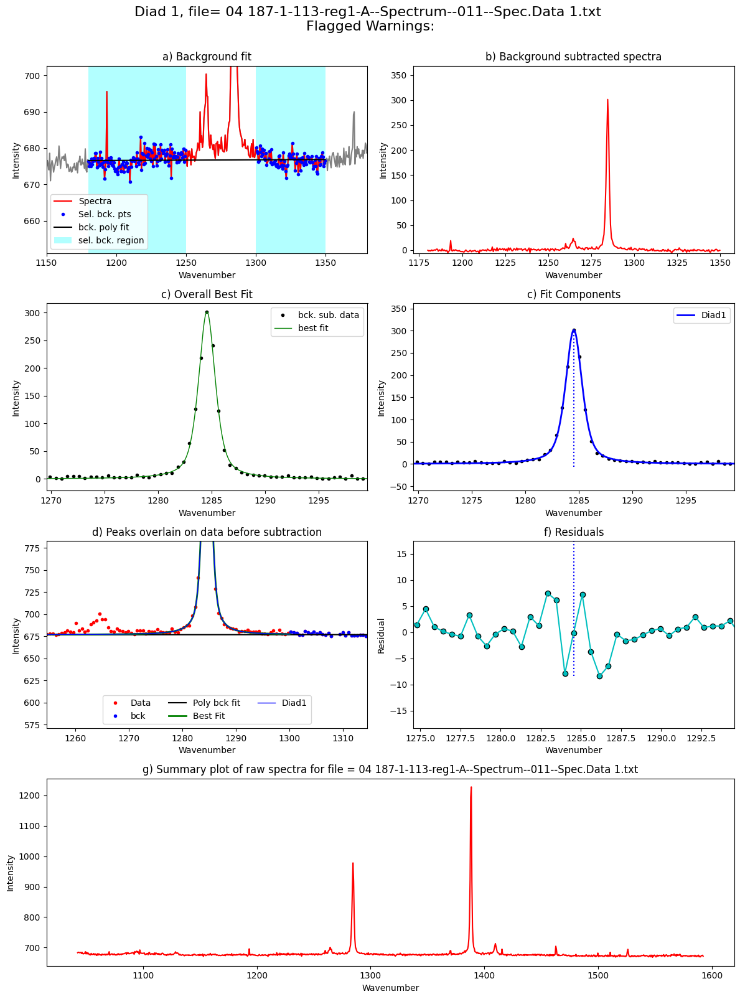

In [8]:
Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_init,
config2=diad_id_config,
path=spectra_path, filename=Diad_Files.iloc[0],
filetype=spectra_filetype, plot_figure=True, close_figure=False,
Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
HB_pos=GroupN_df['HB1_pos'].iloc[i])
Diad1_fit

### Update the sigma
- The sigma parameter varies quite a lot based on the splitting. Best to update your first guess with what you found for the example file above

In [9]:
diad1_fit_config2=diad1_fit_config_init

## Fit diad2

In [10]:
if batch=='Weak':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=2, upper_bck_diad2=(1430, 1480),
    lower_bck_diad2=(1310, 1360), diad_sigma=0.4,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Medium':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1350), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Strong':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1340), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=1000,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init
diad2_fit_config_init

diad2_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, N_poly_bck_diad2=2, lower_bck_diad2=(1310, 1360), upper_bck_diad2=(1430, 1480), fit_gauss=False, gauss_amp=1000, diad_sigma=0.4, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=588.8769770330059, HB_prom=38.20366941750376, C13_prom=10, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=30, return_other_params=False)

### See what these fit parameters look like for diad2

,Diad2_Combofit_Cent,Diad2_Voigt_Cent,Diad2_cent_err,Diad2_Voigt_Area,Diad2_Voigt_Sigma,Diad2_Voigt_Gamma,HB2_Cent,HB2_Area,HB2_Sigma,Diad2_Combofit_Height,Diad2_Residual,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit,Diad2_Asym50,Diad2_Asym70,Diad2_Yuan2017_sym_factor,Diad2_Remigi2021_BSF,Diad2_PDF_Model
0,1388.308733,1388.308683,0.003388,1151.366149,0.662535,0,1409.71453,124.471249,1.14025,612.951133,2.290956,0.773154,1.32507,Flagged Warnings:,1.150649,1.174905,0.199621,0.002162,PseudoVoigtModel


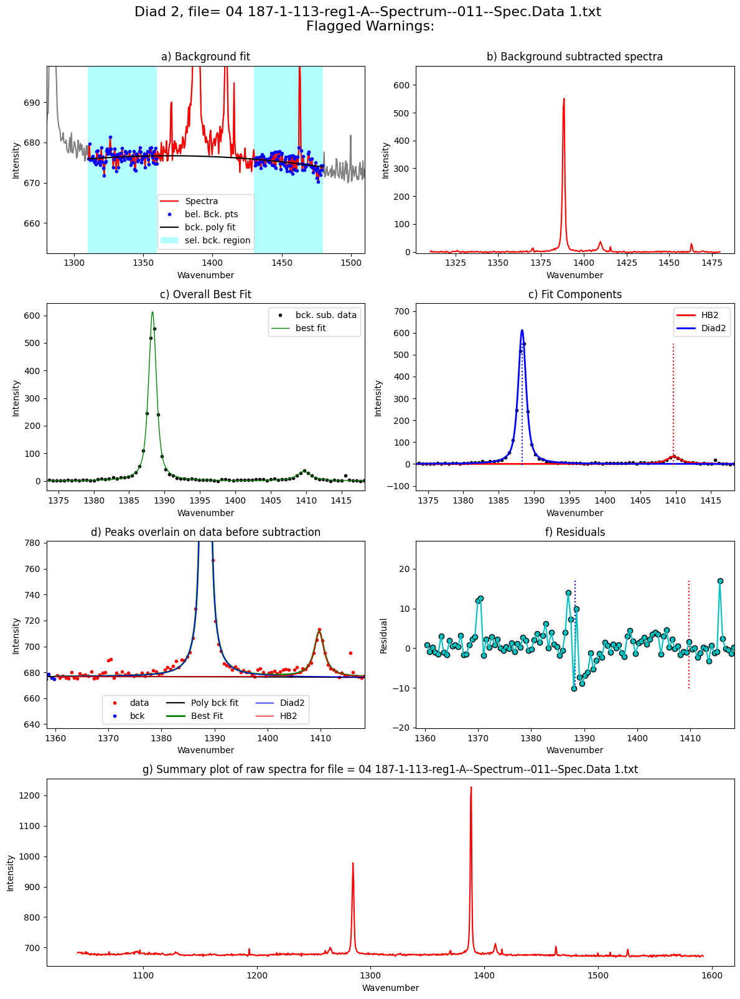

In [11]:
Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
    config2=diad_id_config,
path=spectra_path, filename=Diad_Files[i], filetype=spectra_filetype,
plot_figure=True, close_figure=False, 
Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
HB_pos=GroupN_df['HB2_pos'].iloc[i], 
C13_pos=GroupN_df['C13_pos'].iloc[i])
Diad2_fit.to_clipboard(excel=True)
Diad2_fit

## Loop over all the files in the group
- This will loop over all the 

  0%|          | 0/32 [00:00<?, ?it/s]

Processing file: 04 187-1-113-reg1-A--Spectrum--011--Spec.Data 1.txt


  3%|▎         | 1/32 [00:02<01:05,  2.11s/it]

Processing file: 05 187-1-113-reg1-A--Spectrum--012--Spec.Data 1_CRR_DiadFit.txt


  6%|▋         | 2/32 [00:04<01:06,  2.23s/it]

Processing file: 06 187-1-113-reg1-A--Spectrum--013--Spec.Data 1.txt


  9%|▉         | 3/32 [00:06<01:01,  2.13s/it]

Processing file: 08 187-1-113-reg1-B--Spectrum--023--Spec.Data 1.txt


 12%|█▎        | 4/32 [00:08<00:58,  2.08s/it]

Processing file: 09 187-1-113-reg1-B--Spectrum--024--Spec.Data 1.txt


 16%|█▌        | 5/32 [00:10<00:55,  2.05s/it]

Processing file: 10 187-1-113-reg1-B--Spectrum--025--Spec.Data 1_CRR_DiadFit.txt


 19%|█▉        | 6/32 [00:12<00:53,  2.07s/it]

Processing file: 12 187-1-113-reg2-A--Spectrum--030--Spec.Data 1.txt


 22%|██▏       | 7/32 [00:14<00:52,  2.09s/it]

Processing file: 13 187-1-113-reg2-B--Spectrum--031--Spec.Data 1.txt


 25%|██▌       | 8/32 [00:16<00:49,  2.05s/it]

Processing file: 14 187-1-113-reg2-C--Spectrum--033--Spec.Data 1.txt


 28%|██▊       | 9/32 [00:18<00:46,  2.04s/it]

Processing file: 15 187-1-113-reg3-A--Spectrum--037--Spec.Data 1.txt
below your threshold intensity, we have filled with nans


 31%|███▏      | 10/32 [00:20<00:45,  2.06s/it]c:\users\charl\documents\python dev\diadfit\src\DiadFit\diads.py:3104: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axes=plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(12, 16))


Processing file: 16 187-1-113-reg3-B--Spectrum--039--Spec.Data 1.txt
below your threshold intensity, we have filled with nans


 34%|███▍      | 11/32 [00:23<00:45,  2.19s/it]

Processing file: 17 187-1-113-reg3-C--Spectrum--042--Spec.Data 1_CRR_DiadFit.txt


 38%|███▊      | 12/32 [00:26<00:50,  2.53s/it]

Processing file: 19 187-1-113-reg3-D--Spectrum--045--Spec.Data 1_CRR_DiadFit.txt


 41%|████      | 13/32 [00:30<00:53,  2.84s/it]

Processing file: 20 187-1-113-reg4-A--Spectrum--050--Spec.Data 1_CRR_DiadFit.txt


 44%|████▍     | 14/32 [00:35<01:07,  3.75s/it]

Processing file: 21 187-1-113-reg4-B--Spectrum--052--Spec.Data 1_CRR_DiadFit.txt
below your threshold intensity, we have filled with nans


 47%|████▋     | 15/32 [00:39<01:01,  3.62s/it]

Processing file: 22 187-1-113-reg4-C--Spectrum--053--Spec.Data 1_CRR_DiadFit.txt


 50%|█████     | 16/32 [00:42<00:57,  3.60s/it]

Processing file: 23 187-1-113-reg3-D--Spectrum--054--Spec.Data 1.txt


 53%|█████▎    | 17/32 [00:46<00:56,  3.75s/it]

Processing file: 24 187-1-113-reg3-C--Spectrum--055--Spec.Data 1.txt


 56%|█████▋    | 18/32 [00:50<00:49,  3.56s/it]

Processing file: 25 187-1-113-reg3-B--Spectrum--056--Spec.Data 1.txt


 59%|█████▉    | 19/32 [00:53<00:47,  3.64s/it]

Processing file: 27 187-1-113-reg5-A--Spectrum--061--Spec.Data 1_CRR_DiadFit.txt


 62%|██████▎   | 20/32 [00:57<00:42,  3.56s/it]

Processing file: 28 187-1-113-reg5-B--Spectrum--062--Spec.Data 1.txt


 66%|██████▌   | 21/32 [01:00<00:37,  3.45s/it]

Processing file: 29 187-1-113-reg5-C--Spectrum--064--Spec.Data 1.txt


 69%|██████▉   | 22/32 [01:04<00:35,  3.58s/it]

Processing file: 31 187-1-114-reg1-A--Spectrum--071--Spec.Data 1.txt


 72%|███████▏  | 23/32 [01:07<00:30,  3.41s/it]

Processing file: 32 187-1-114-reg1-B--Spectrum--073--Spec.Data 1.txt


 75%|███████▌  | 24/32 [01:10<00:26,  3.34s/it]

Processing file: 33 187-1-114-reg1-C--Spectrum--075--Spec.Data 1.txt


 78%|███████▊  | 25/32 [01:13<00:21,  3.13s/it]

Processing file: 34 187-1-114-reg1-A--Spectrum--077--Spec.Data 1.txt


 81%|████████▏ | 26/32 [01:16<00:19,  3.22s/it]

Processing file: 36 187-1-114-reg2-A--Spectrum--082--Spec.Data 1.txt


 84%|████████▍ | 27/32 [01:20<00:16,  3.33s/it]

Processing file: 39 187-1-114-reg3-B--Spectrum--089--Spec.Data 1.txt


 88%|████████▊ | 28/32 [01:23<00:13,  3.44s/it]

Processing file: 43 187-1-115-C--Spectrum--100--Spec.Data 1.txt


 91%|█████████ | 29/32 [01:27<00:10,  3.47s/it]

Processing file: 44 187-1-115-C--Spectrum--101--Spec.Data 1_CRR_DiadFit.txt


 94%|█████████▍| 30/32 [01:30<00:06,  3.37s/it]

Processing file: 45 187-1-115-C--Spectrum--102--Spec.Data 1.txt


 97%|█████████▋| 31/32 [01:33<00:03,  3.39s/it]

Processing file: 48 FO1--Spectrum--105--Spec.Data 1_CRR_DiadFit.txt


100%|██████████| 32/32 [01:37<00:00,  3.03s/it]


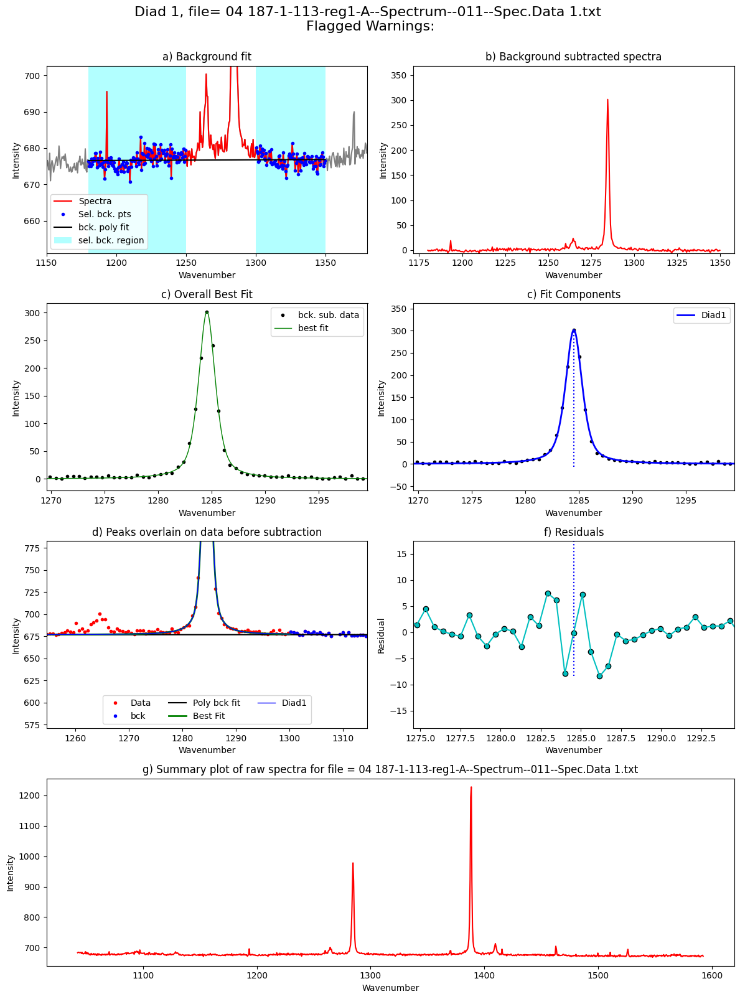

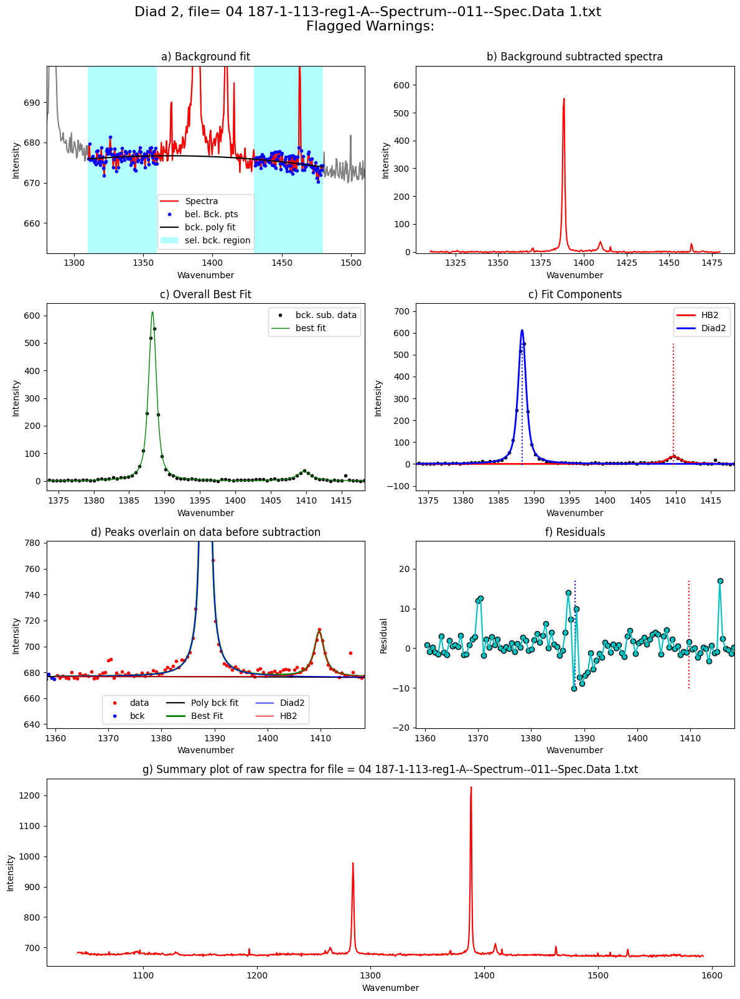

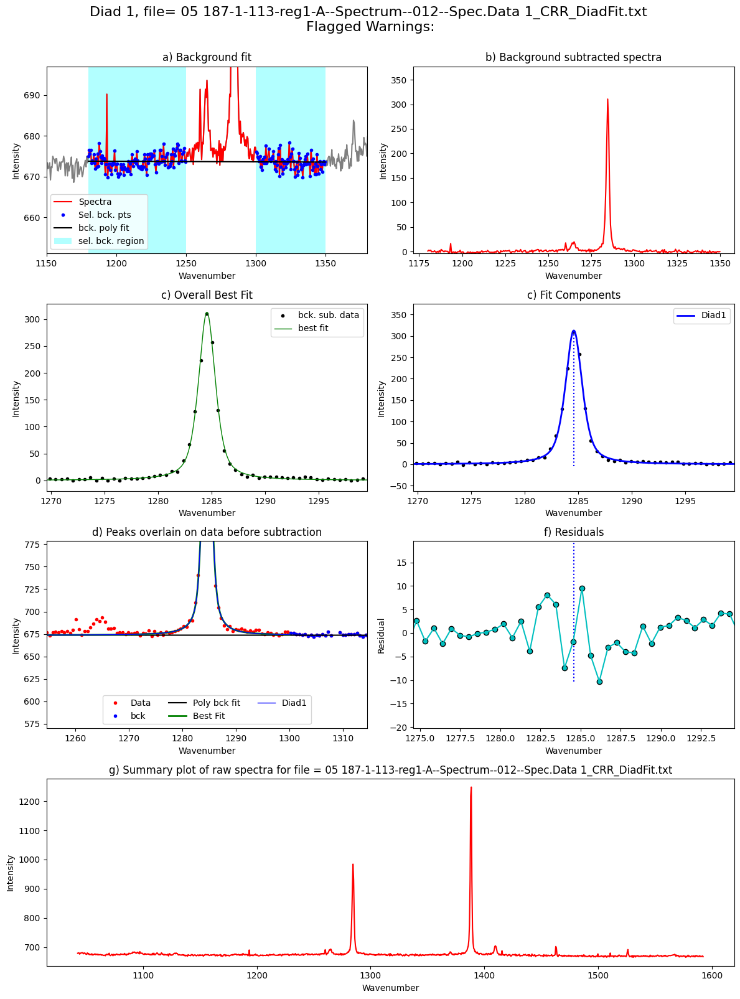

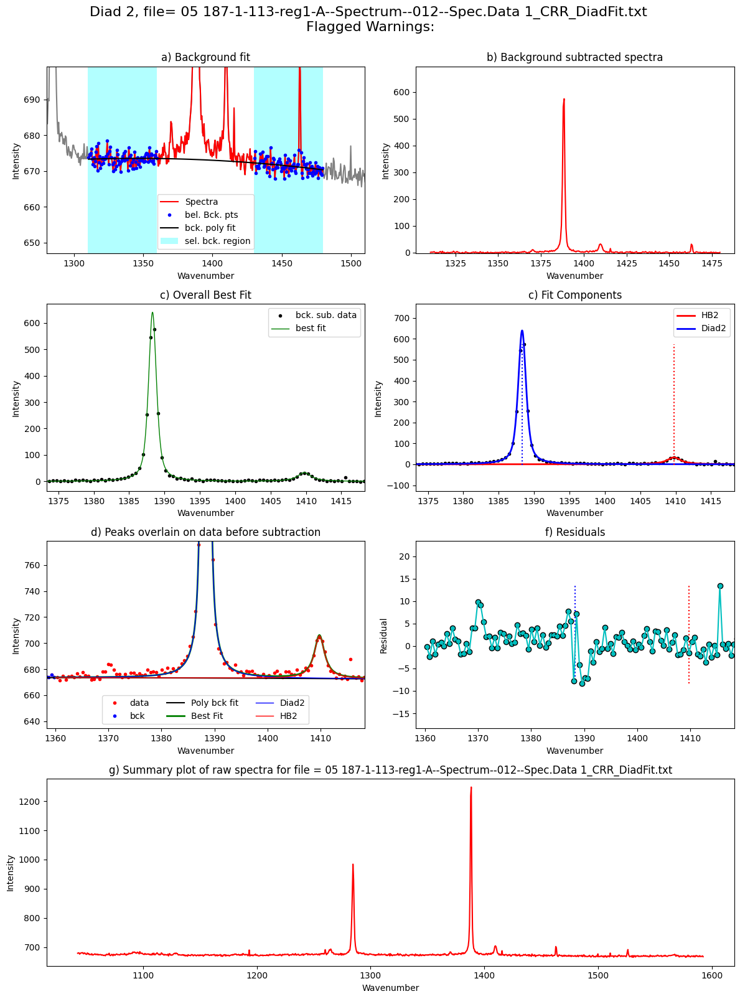

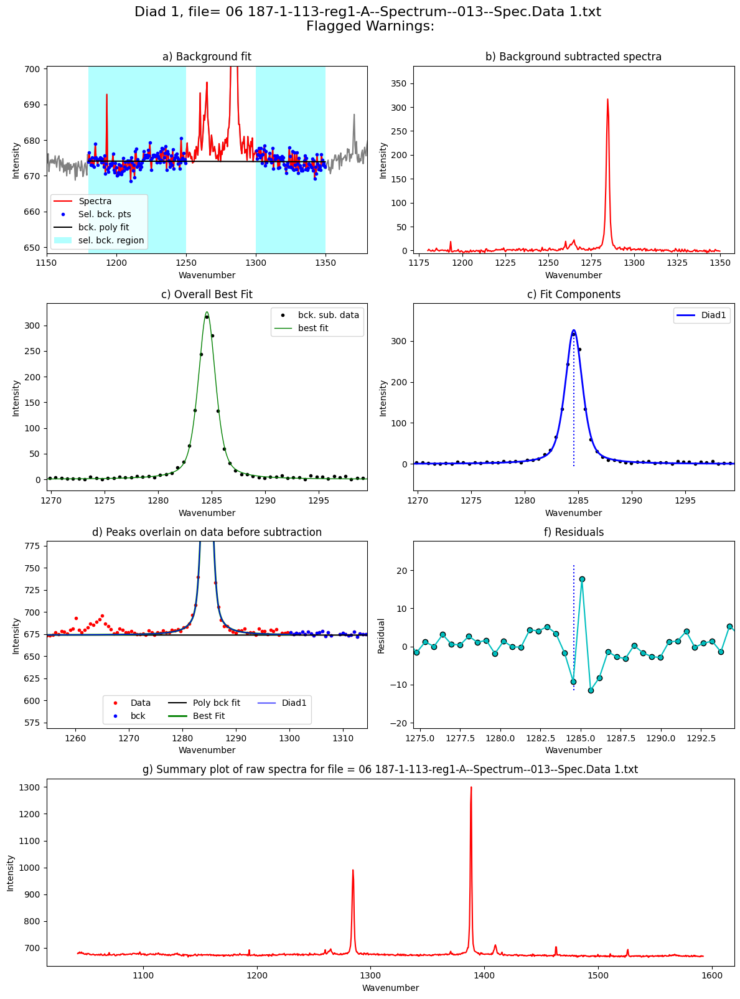

...

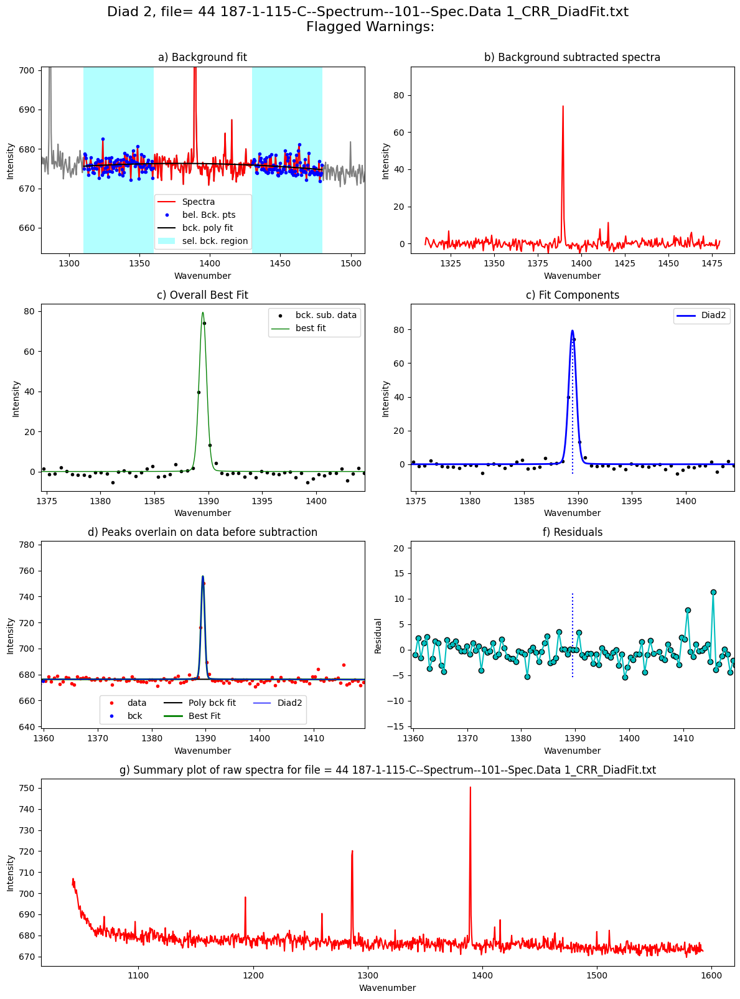

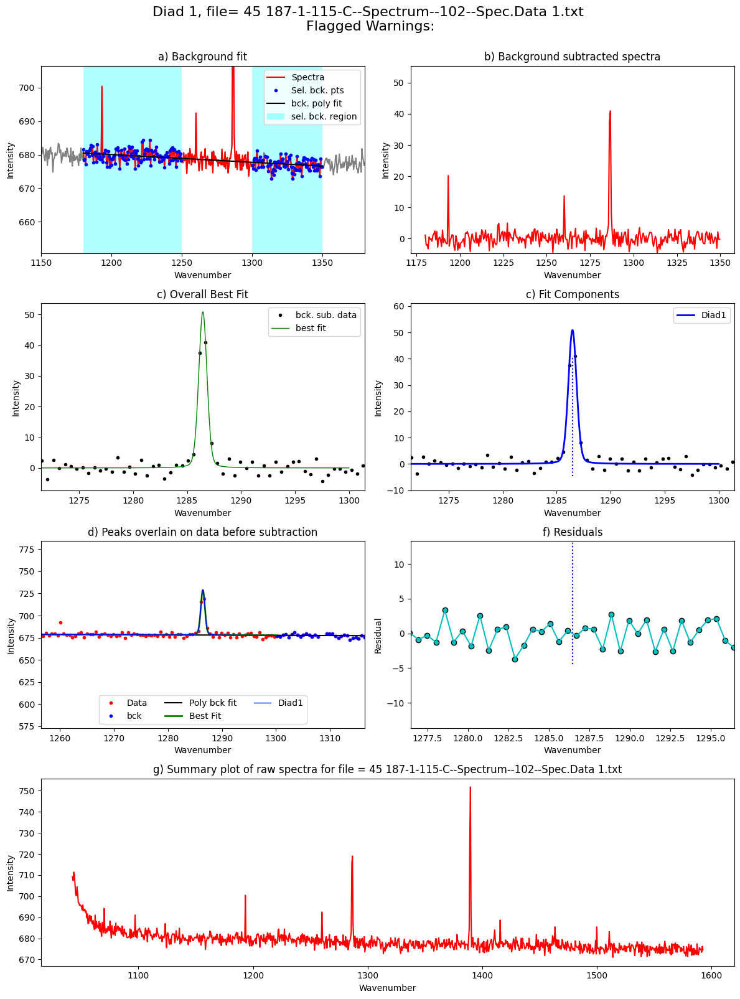

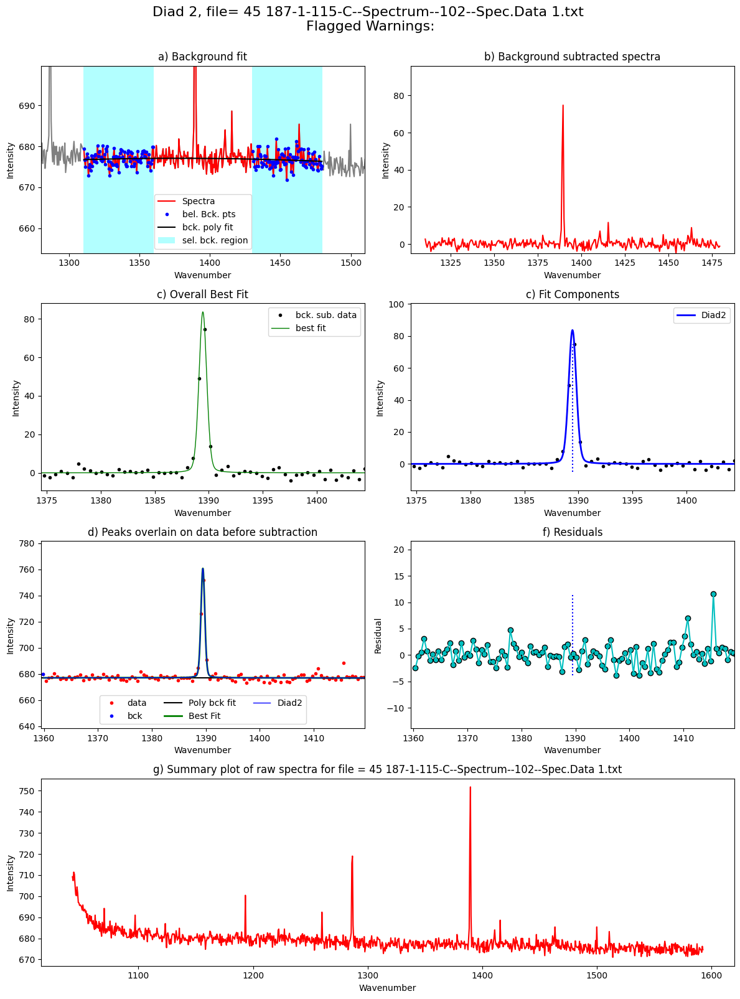

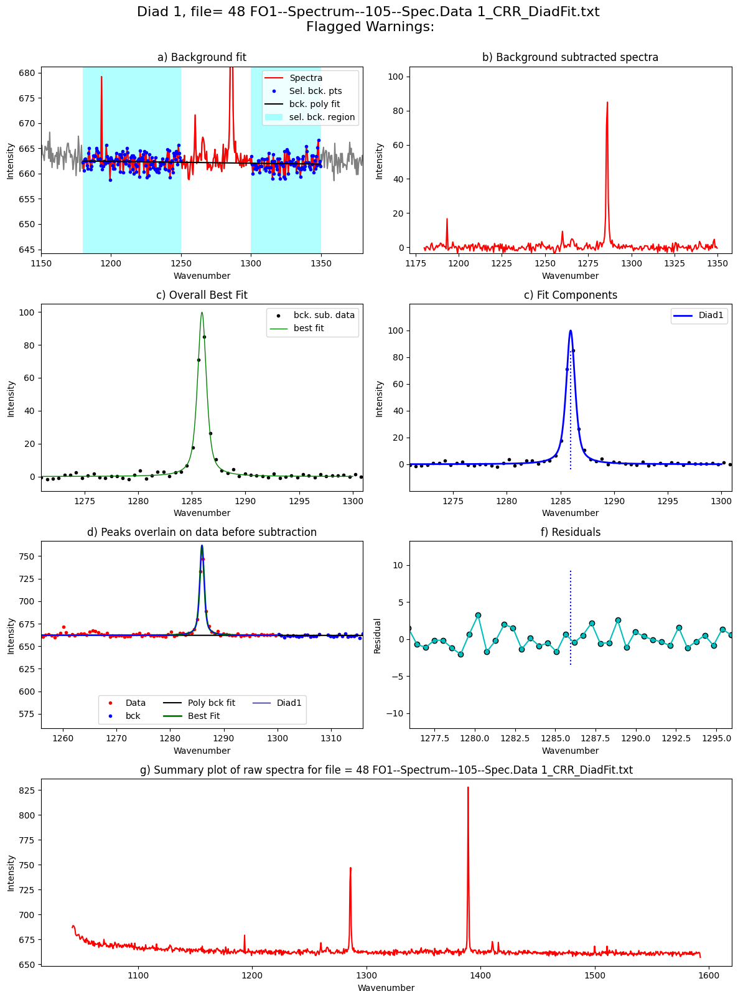

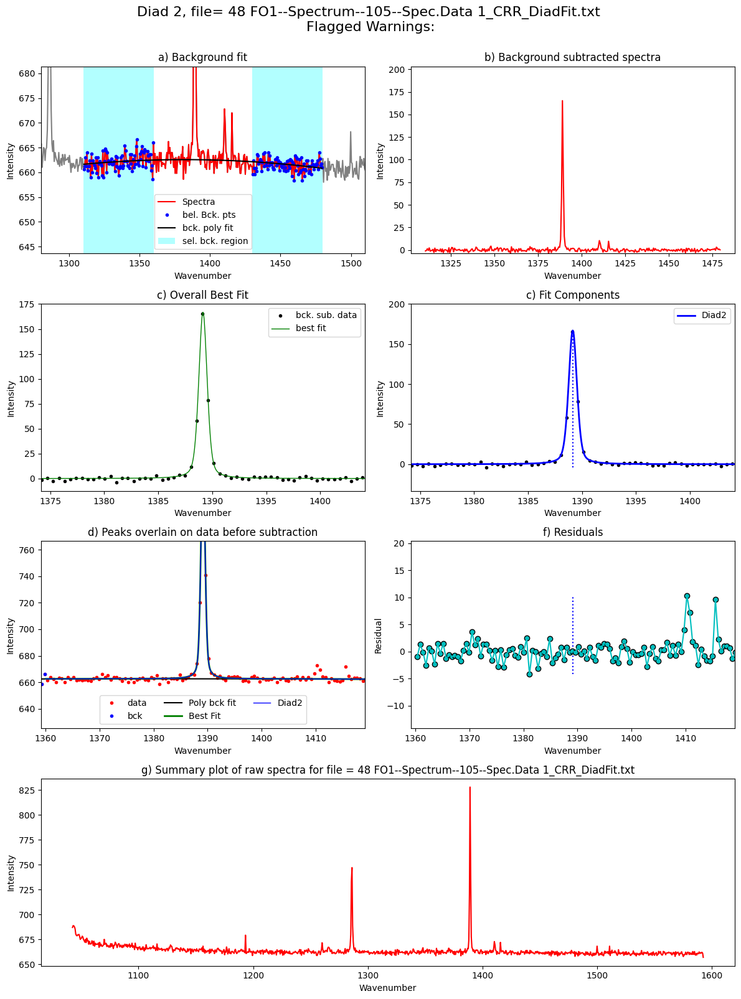

In [12]:
from tqdm import tqdm
plot_figure=True# If False, Means doesnt have to make figures, lot faster. 
close_figure=False # If True, wont show figures in notebook, but will still save them in a folder 
Diad_Files_i=Diad_Files
df_Merge = pd.DataFrame([])
for i in tqdm(range(0, len(Diad_Files))): #
    tqdm.write(f"Processing file: {Diad_Files[i]}")
    
    
    # For diad1, config file like you had in the previous. 
    # Only really used to exclude a range (say your spectra has a known spec)
    diad_id_config=pf.diad_id_config(exclude_range1=[1308, 1309])
    
    # Here, the prominence are taken from the fitting in the last notebook
    diad1_fit_config2.HB_prom=GroupN_df['HB1_abs_prom'].iloc[i]
    diad1_fit_config2.diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i]
    diad1_fit_config2.gauss_amp=2*GroupN_df['HB1_abs_prom'].iloc[i]

    Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config2,
    config2=diad_id_config, path=spectra_path, filename=GroupN_df['filename'].iloc[i],
    filetype=spectra_filetype, plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
    HB_pos=GroupN_df['HB1_pos'].iloc[i])

    ## Same for diad2, just also has a C13 peak
    diad2_fit_config_init.HB_prom=GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i]
    diad2_fit_config_init.gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.C13_prom=GroupN_df['C13_abs_prom'].iloc[i]
    
    
    Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
        config2=diad_id_config,
    path=spectra_path, filename=GroupN_df['filename'].iloc[i], 
    filetype=spectra_filetype,
    plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
    HB_pos=GroupN_df['HB2_pos'].iloc[i], 
    C13_pos=GroupN_df['C13_pos'].iloc[i])
    
    # This combines the outputs into a single dataframe
    data=pf.combine_diad_outputs(filename=GroupN_df['filename'].iloc[i], prefix=prefix, 
    Diad1_fit=Diad1_fit, path=spectra_path,                  
    Diad2_fit=Diad2_fit)        
    
 

    df_Merge = pd.concat([df_Merge, data], axis=0).reset_index(drop=True)


In [13]:
# Save parameters to excel
combo=df_Merge

if batch=='Weak':
    combo.to_excel('Weak_Diads.xlsx', index=False)
if batch=='Medium':
    combo.to_excel('Medium_Diads.xlsx', index=False)
if batch=='Strong':
    combo.to_excel('Strong_Diads.xlsx', index=False)

In [14]:
combo

,filename,Splitting,Split_σ,Diad1_Combofit_Cent,Diad1_cent_err,Diad1_Combofit_Height,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Residual,...,Diad1_Asym50,Diad1_Asym70,Diad1_Yuan2017_sym_factor,Diad1_Remigi2021_BSF,Diad2_Asym50,Diad2_Asym70,Diad2_Yuan2017_sym_factor,Diad2_Remigi2021_BSF,Diad1_PDF_Model,Diad2_PDF_Model
0,187-1-113-reg1-A--Spectrum--011--Spec.Data 1,103.750510,0.009629,1284.558173,0.009013,301.494602,1284.558173,763.311123,0.926878,3.378029,...,1.083333,1.154696,0.154480,0.006149,1.150649,1.174905,0.199621,0.002162,PseudoVoigtModel,PseudoVoigtModel
1,187-1-113-reg1-A--Spectrum--012--Spec.Data 1_C...,103.731348,0.009085,1284.578803,0.008479,312.828738,1284.578803,799.490060,0.932701,3.634035,...,1.098485,1.172702,0.183714,0.005963,1.111959,1.117537,0.149164,0.002081,PseudoVoigtModel,PseudoVoigtModel
2,187-1-113-reg1-A--Spectrum--013--Spec.Data 1,103.752469,0.009512,1284.579141,0.008883,326.397253,1284.579141,823.425262,0.954087,3.902843,...,1.271457,1.279823,0.517987,0.005846,1.189840,1.186408,0.247346,0.001892,PseudoVoigtModel,PseudoVoigtModel
3,187-1-113-reg1-B--Spectrum--023--Spec.Data 1,103.699687,0.008086,1284.661568,0.007701,464.682206,1284.661568,1153.549677,0.905319,5.022840,...,1.196721,1.217327,0.356191,0.003897,1.129114,1.113553,0.176264,0.001472,PseudoVoigtModel,PseudoVoigtModel
4,187-1-113-reg1-B--Spectrum--024--Spec.Data 1,103.710162,0.007803,1284.661288,0.007433,479.533518,1284.661288,1187.251740,0.905836,4.951129,...,1.166667,1.220414,0.301945,0.003778,1.133508,1.099065,0.175259,0.001354,PseudoVoigtModel,PseudoVoigtModel
5,187-1-113-reg1-B--Spectrum--025--Spec.Data 1_C...,103.718408,0.005533,1284.663367,0.004888,521.622507,1284.663417,1294.248111,0.909595,3.209275,...,1.190283,1.221893,0.346162,0.003488,1.190217,1.171540,0.247564,0.001204,PseudoVoigtModel,PseudoVoigtModel
6,187-1-113-reg2-A--Spectrum--030--Spec.Data 1,103.654886,0.008557,1284.829115,0.008089,289.104514,1284.829115,679.691439,0.825940,3.205740,...,1.066946,1.117211,0.110586,0.005714,1.118598,1.118447,0.154060,0.002291,PseudoVoigtModel,PseudoVoigtModel
7,187-1-113-reg2-B--Spectrum--031--Spec.Data 1,103.738833,0.008553,1284.620804,0.008210,341.764569,1284.620804,873.906635,0.930141,3.874858,...,1.063670,1.141289,0.118445,0.005443,1.171429,1.144712,0.231179,0.001918,PseudoVoigtModel,PseudoVoigtModel
8,187-1-113-reg2-C--Spectrum--033--Spec.Data 1,103.714141,0.010766,1284.661134,0.009606,247.203986,1284.661134,622.914020,0.943376,2.807866,...,1.205479,1.302360,0.387689,0.007632,1.202667,1.183206,0.271715,0.002539,PseudoVoigtModel,PseudoVoigtModel
9,187-1-113-reg3-A--Spectrum--037--Spec.Data 1,103.704084,0.050248,1284.855167,0.044882,28.134534,1284.855167,50.263796,0.735524,0.956503,...,1.233766,1.264540,0.343881,0.052286,1.038835,1.134545,0.054583,0.030393,PseudoVoigtModel,PseudoVoigtModel


### This plays a sound when the notebook is done if you have a tendency to procrastinate

In [15]:
# !pip install winotify

from winotify import Notification, audio

toast= Notification(app_id="VSCode",title="Notebook completed",
                    msg="Step3b_Secondary_Peaks is done!",
                    duration="short")
toast.set_audio(audio.Mail,loop=False)
toast.show()